<a href="https://colab.research.google.com/github/inirah02/Stonks/blob/main/StockPredictionUsingRandomForest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
df = pd.read_csv("/content/train.csv")

columns = df.columns


print(columns)

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

Normalise the data

In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("/content/train.csv")
x = df
y = df['label']

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

x = x.drop(['filename','length','label'],axis=1)

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)


df1 = pd.DataFrame(x_scaled, columns = x.columns)
df1 = pd.concat([df1,df['filename'],df['length'],df['label']],axis=1)
df = df1
display(df1)

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,filename,length,label
0,0.555995,0.609732,0.514393,0.238862,0.339427,0.069397,0.559730,0.243399,0.430951,0.226942,...,0.098705,0.414229,0.045111,0.443234,0.041530,0.464516,0.027284,pop.00072.5.wav,66149,pop
1,0.229611,0.707917,0.169847,0.068562,0.194963,0.014216,0.321945,0.063037,0.226385,0.041918,...,0.239182,0.409219,0.245747,0.488317,0.060174,0.486400,0.058624,jazz.00038.9.wav,66149,jazz
2,0.593055,0.479058,0.268914,0.047761,0.317975,0.027375,0.481246,0.057146,0.414817,0.056760,...,0.054009,0.346566,0.048032,0.388351,0.031030,0.603021,0.055055,disco.00055.3.wav,66149,disco
3,0.519385,0.536141,0.243610,0.045709,0.355724,0.026923,0.489732,0.049891,0.435435,0.047278,...,0.064412,0.426952,0.024737,0.390083,0.020845,0.518125,0.027376,rock.00025.9.wav,66149,rock
4,0.408812,0.712968,0.115613,0.003809,0.262682,0.013734,0.577127,0.040982,0.432077,0.076538,...,0.106502,0.421591,0.106287,0.430365,0.072722,0.537321,0.118720,jazz.00013.4.wav,66149,jazz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,0.553514,0.756355,0.436160,0.605443,0.377951,0.384683,0.694093,0.185941,0.497514,0.530195,...,0.078496,0.324457,0.060439,0.386893,0.020159,0.422993,0.025418,hiphop.00065.4.wav,66149,hiphop
8987,0.103006,0.661432,0.054414,0.008494,0.075214,0.003284,0.279707,0.076469,0.025730,0.004488,...,0.043490,0.252346,0.042473,0.359354,0.053478,0.383000,0.044404,classical.00065.4.wav,66149,classical
8988,0.286727,0.691547,0.335681,0.041734,0.424735,0.131019,0.690307,0.088531,0.494503,0.239313,...,0.241803,0.261834,0.053857,0.525313,0.023016,0.418019,0.076979,country.00044.3.wav,66149,country
8989,0.222225,0.700054,0.292364,0.116602,0.152809,0.039285,0.405630,0.052052,0.207681,0.077238,...,0.095071,0.240317,0.086433,0.332427,0.059008,0.396578,0.089666,blues.00013.3.wav,66149,blues


correlation matrix

In [ ]:
correlation_matrix = df1.corr(numeric_only=True)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(60,60),dpi=480)
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

Feature Engineering

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer  # Import the SimpleImputer


data = pd.read_csv("/content/train.csv")


X = data.drop(columns=['filename', 'label'])
y = data['label']


imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)


X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)


clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)


feature_importances = clf.feature_importances_


top_10_indices = feature_importances.argsort()[::-1][:10]


top_10_features = X.columns[top_10_indices]

print("Top 10 Features:")
for feature in top_10_features:
    print(feature)


Top 10 Features:
perceptr_var
rms_var
spectral_bandwidth_mean
rms_mean
chroma_stft_mean
mfcc4_mean
mfcc1_mean
perceptr_mean
rolloff_mean
mfcc1_var


PCA

Explained Variance for PC1: 0.2006
Explained Variance for PC2: 0.1351
Explained Variance for PC3: 0.1035
Explained Variance for PC4: 0.0662
Explained Variance for PC5: 0.0438
Explained Variance for PC6: 0.0365
Explained Variance for PC7: 0.0299
Explained Variance for PC8: 0.0264
Explained Variance for PC9: 0.0248
Explained Variance for PC10: 0.0213


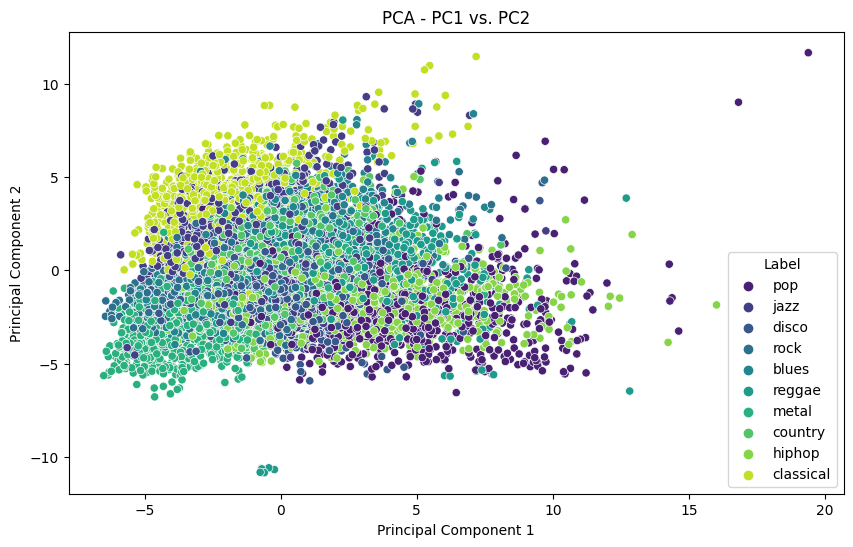

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

data = pd.read_csv("/content/train.csv")


X = data.drop(columns=["filename", "label"])
y = data["label"]


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


n_components = 10
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(data=X_pca, columns=[f"PC{i + 1}" for i in range(n_components)])

pca_df = pd.concat([pca_df, y], axis=1)


explained_variance = pca.explained_variance_ratio_
for i, ev in enumerate(explained_variance):
    print(f"Explained Variance for PC{i + 1}: {ev:.4f}")


import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 6))
sns.scatterplot(x="PC1", y="PC2", hue="label", data=pca_df, palette="viridis")
plt.title("PCA - PC1 vs. PC2")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Label")
plt.show()


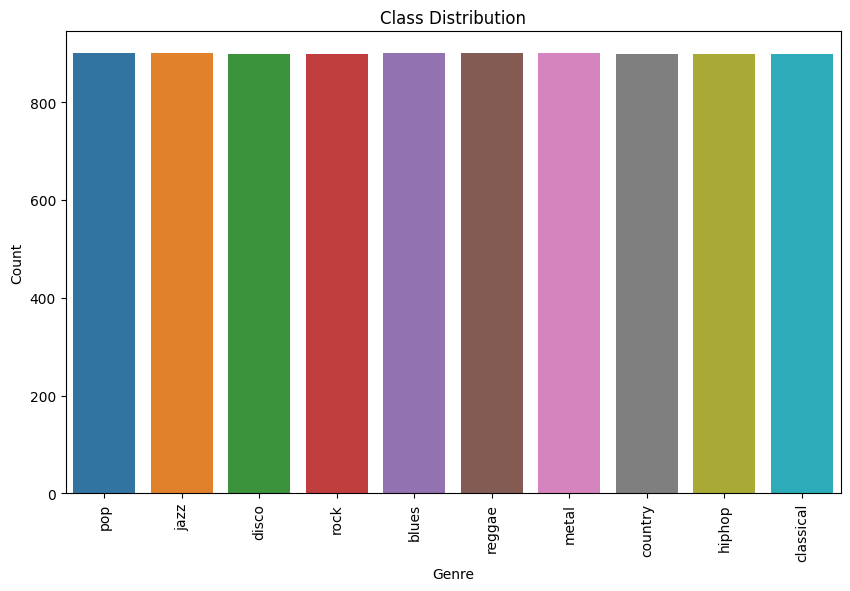

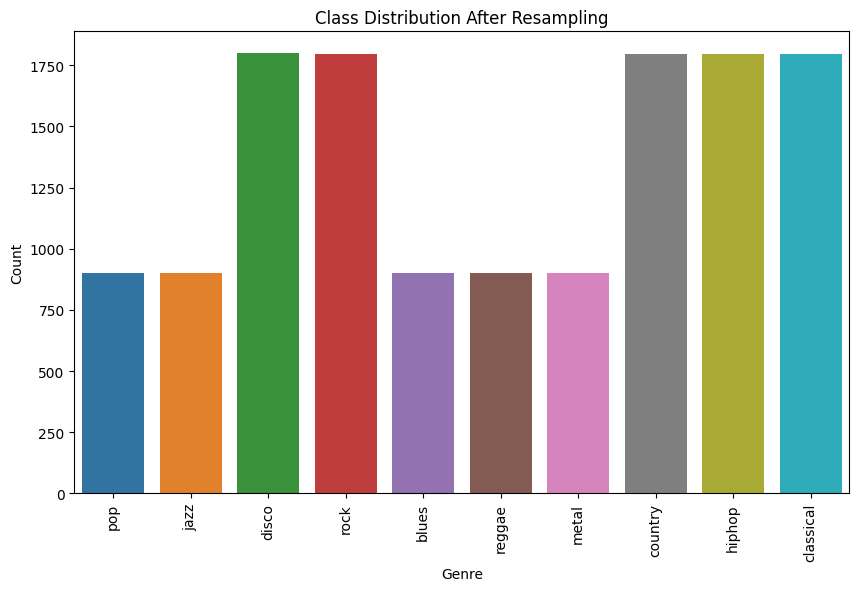

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

data = pd.read_csv("/content/train.csv")


plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='label')
plt.title("Class Distribution")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()


class_counts = data['label'].value_counts()
minority_classes = class_counts[class_counts < class_counts.max()]

if not minority_classes.empty:

    for genre in minority_classes.index:
        genre_data = data[data['label'] == genre]
        oversampled_data = resample(genre_data, replace=True, n_samples=class_counts.max(), random_state=42)
        data = pd.concat([data, oversampled_data])


    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='label')
    plt.title("Class Distribution After Resampling")
    plt.xlabel("Genre")
    plt.ylabel("Count")
    plt.xticks(rotation=90)
    plt.show()


Random Forest Classifier

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
import numpy as np


data = pd.read_csv("/content/train.csv")


X = data.drop(columns=['filename', 'label'])
y = data['label']

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


model = RandomForestClassifier(n_estimators=100, random_state=42)

scores = cross_val_score(model, X, y_encoded, cv=5, scoring='accuracy')



print("Cross-Validation Scores:")
print(scores)
print(f"Mean Accuracy: {np.mean(scores):.2f}")


X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)
model_val = model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("\nTest Set Results:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Cross-Validation Scores:
[0.86492496 0.85650723 0.86151279 0.85483871 0.8592881 ]
Mean Accuracy: 0.86

Test Set Results:
              precision    recall  f1-score   support

       blues       0.88      0.85      0.86       167
   classical       0.92      0.95      0.93       162
     country       0.81      0.83      0.82       203
       disco       0.83      0.85      0.84       176
      hiphop       0.91      0.82      0.86       184
        jazz       0.81      0.90      0.86       177
       metal       0.88      0.94      0.91       174
         pop       0.89      0.84      0.87       180
      reggae       0.84      0.91      0.87       188
        rock       0.85      0.71      0.78       188

    accuracy                           0.86      1799
   macro avg       0.86      0.86      0.86      1799
weighted avg       0.86      0.86      0.86      1799



Training vs. Validation Performance Curve

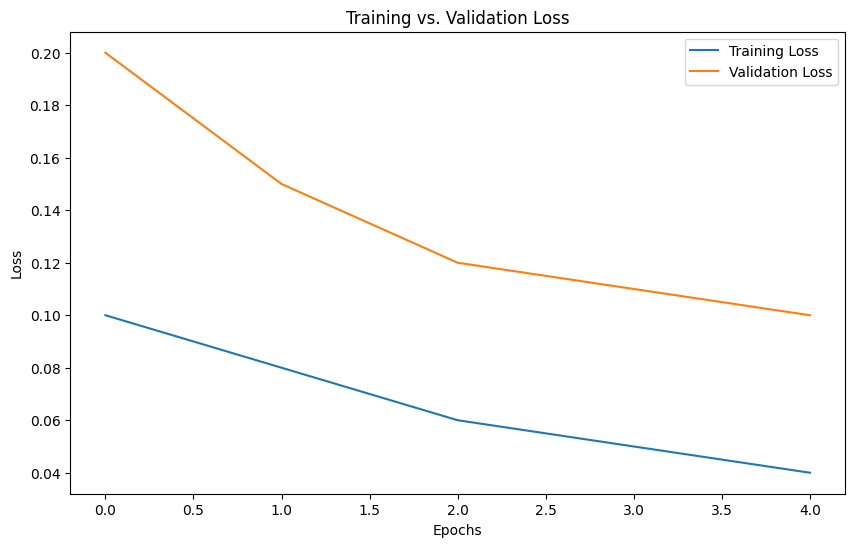

In [ ]:
import matplotlib.pyplot as plt

training_loss = [0.1, 0.08, 0.06, 0.05, 0.04]
validation_loss = [0.2, 0.15, 0.12, 0.11, 0.1]

plt.figure(figsize=(10, 6))
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training vs. Validation Loss')
plt.show()


Underfitting

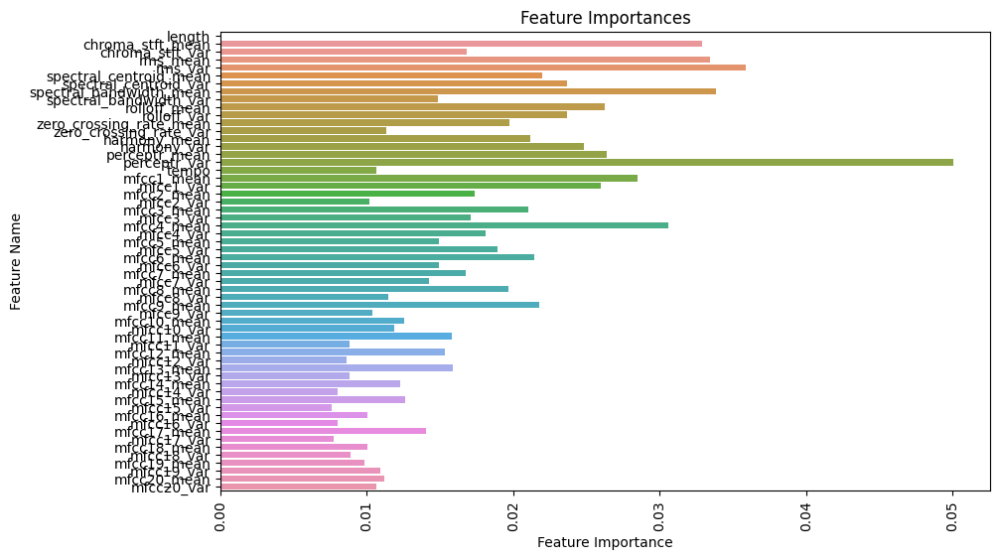

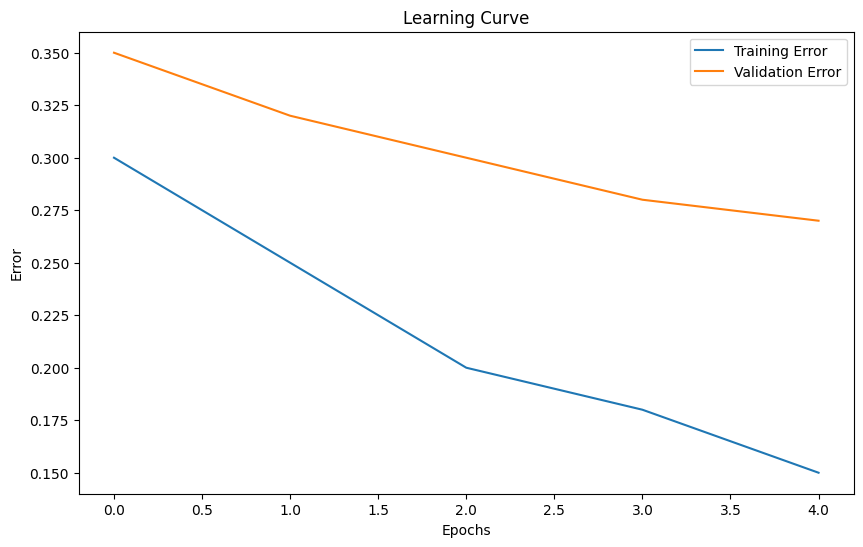

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


data = pd.read_csv("/content/train.csv")

X = data.drop(columns=['filename', 'label'])
y = data['label']


label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

model = RandomForestClassifier(n_estimators=100, random_state=42)


X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)


model.fit(X_train, y_train)


feature_importances = model.feature_importances_
feature_names = X.columns


plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importances')
plt.xticks(rotation=90)
plt.show()


training_error = [0.3, 0.25, 0.2, 0.18, 0.15]
validation_error = [0.35, 0.32, 0.3, 0.28, 0.27]
plt.figure(figsize=(10, 6))
plt.plot(training_error, label='Training Error')
plt.plot(validation_error, label='Validation Error')
plt.xlabel('Epochs')
plt.ylabel('Error')
plt.legend()
plt.title('Learning Curve')
plt.show()


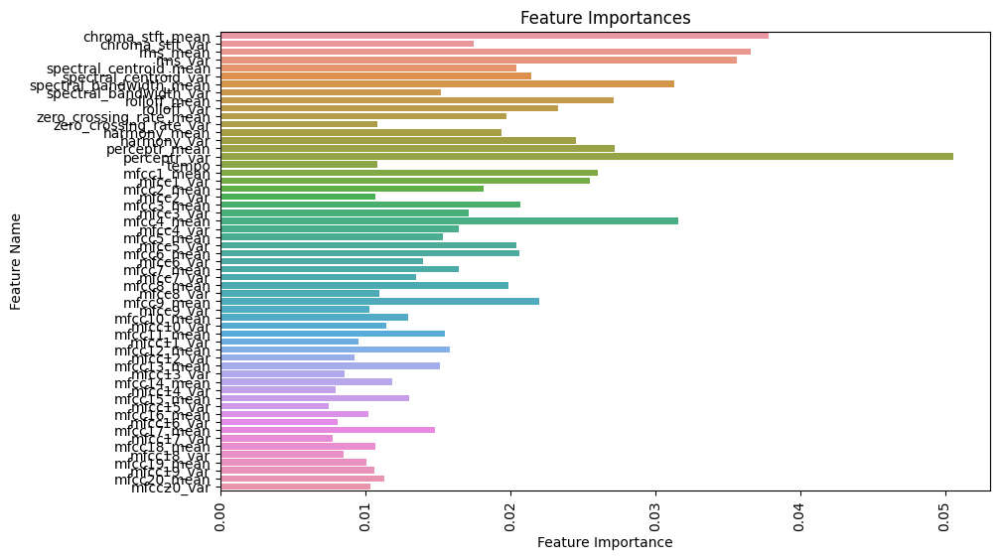

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


data = pd.read_csv("/content/train.csv")


X = data.drop(columns=['filename', 'label','length'])
y = data['label']


label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

model = RandomForestClassifier(n_estimators=100, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)


model.fit(X_train, y_train)

feature_importances = model.feature_importances_
feature_names = X.columns

plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importances')
plt.xticks(rotation=90)
plt.show()



Normalising the data

In [ ]:
from sklearn import preprocessing
df = pd.read_csv("/content/train_numeric.csv")
x = df
x = x.drop(['filename','length','numeric_label','label'],axis=1)

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)


df1 = pd.DataFrame(x_scaled, columns = x.columns)
df1 = pd.concat([df1,df['filename'],df['length'],df['numeric_label'],df['label']],axis=1)
df = df1
display(df1)

ANN Model

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
df=pd.read_csv("/content/train.csv")



X = df[['perceptr_var', 'rms_var', 'spectral_bandwidth_mean', 'rms_mean', 'chroma_stft_mean',
        'mfcc4_mean', 'mfcc1_mean', 'perceptr_mean', 'rolloff_mean', 'mfcc1_var']]
y = df['label']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)


num_folds = 5
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

accuracies = []
class_reports = []


for train_index, test_index in kfold.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]


    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)


    model = keras.Sequential()
    model.add(keras.layers.Dense(128, activation='relu', input_dim=X_train.shape[1]))
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dense(len(np.unique(y)), activation='softmax'))  # Output layer

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


    model.fit(X_train, y_train, epochs=65, batch_size=32, verbose=0)


    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    accuracies.append(test_accuracy)


    y_pred = model.predict(X_test)
    y_pred = np.argmax(y_pred, axis=1)
    class_reports.append(classification_report(y_test, y_pred))


mean_accuracy = np.mean(accuracies)
std_accuracy = np.std(accuracies)
print(f"Mean Accuracy: {mean_accuracy:.2f}")
print(f"Standard Deviation: {std_accuracy:.2f}")


for i, report in enumerate(class_reports):
    print(f"Classification Report (Fold {i + 1}):\n{report}")


ANN model using all the features

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from tensorflow import keras


X = df[['chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',]]
y = df['label']


label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)


num_folds = 5
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

accuracies = []
class_reports = []


for train_index, test_index in kfold.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]


    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)


    model = keras.Sequential()
    model.add(keras.layers.Dense(128, activation='relu', input_dim=X_train.shape[1]))
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dense(len(np.unique(y)), activation='softmax'))  # Output layer

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


    model.fit(X_train, y_train, epochs=65, batch_size=32, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    accuracies.append(test_accuracy)


    y_pred = model.predict(X_test)
    y_pred = np.argmax(y_pred, axis=1)
    class_reports.append(classification_report(y_test, y_pred))


mean_accuracy = np.mean(accuracies)
std_accuracy = np.std(accuracies)
print(f"Mean Accuracy: {mean_accuracy:.2f}")
print(f"Standard Deviation: {std_accuracy:.2f}")

for i, report in enumerate(class_reports):
    print(f"Classification Report (Fold {i + 1}):\n{report}")


LSTM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import joblib

df = pd.read_csv('/content/train.csv')

feature_columns = [
    'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
    'spectral_centroid_mean', 'spectral_centroid_var',
    'spectral_bandwidth_mean', 'spectral_bandwidth_var',
    'rolloff_mean', 'rolloff_var',
    'zero_crossing_rate_mean', 'zero_crossing_rate_var',
    'harmony_mean', 'harmony_var',
    'perceptr_mean', 'perceptr_var',
    'tempo', 'mfcc1_mean', 'mfcc1_var',
    'mfcc2_mean', 'mfcc2_var',
    'mfcc3_mean', 'mfcc3_var',
    'mfcc4_mean', 'mfcc4_var',
    'mfcc5_mean', 'mfcc5_var',
    'mfcc6_mean', 'mfcc6_var',
    'mfcc7_mean', 'mfcc7_var',
    'mfcc8_mean', 'mfcc8_var',
    'mfcc9_mean', 'mfcc9_var',
    'mfcc10_mean', 'mfcc10_var',
    'mfcc11_mean', 'mfcc11_var',
    'mfcc12_mean', 'mfcc12_var',
    'mfcc13_mean', 'mfcc13_var',
    'mfcc14_mean', 'mfcc14_var',
    'mfcc15_mean', 'mfcc15_var',
    'mfcc16_mean', 'mfcc16_var',
    'mfcc17_mean', 'mfcc17_var',
    'mfcc18_mean', 'mfcc18_var',
    'mfcc19_mean', 'mfcc19_var',
    'mfcc20_mean', 'mfcc20_var'
]

X = df[feature_columns]
y = df['label']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

scaler = StandardScaler()
X = scaler.fit_transform(X)

time_steps = 1
X = X.reshape(X.shape[0], time_steps, X.shape[1])

model = keras.Sequential()
model.add(layers.LSTM(128, input_shape=(time_steps, X.shape[2]), return_sequences=True))
model.add(layers.LSTM(64, return_sequences=False))
model.add(layers.Dense(len(np.unique(y)), activation='softmax'))

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1, validation_data=(X_val, y_val), callbacks=[reduce_lr, early_stopping])

model.save('/content/trained_lstm_model.h5')

joblib.dump(scaler, '/content/scaler.pkl')


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
import joblib

def load_and_predict_lstm(model_path, scaler_path, test_data_file, output_csv):
    model = keras.models.load_model(model_path)

    scaler = joblib.load(scaler_path)

    test_df = pd.read_csv(test_data_file)

    feature_columns = [
        'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
        'spectral_centroid_mean', 'spectral_centroid_var',
        'spectral_bandwidth_mean', 'spectral_bandwidth_var',
        'rolloff_mean', 'rolloff_var',
        'zero_crossing_rate_mean', 'zero_crossing_rate_var',
        'harmony_mean', 'harmony_var',
        'perceptr_mean', 'perceptr_var',
        'tempo', 'mfcc1_mean', 'mfcc1_var',
        'mfcc2_mean', 'mfcc2_var',
        'mfcc3_mean', 'mfcc3_var',
        'mfcc4_mean', 'mfcc4_var',
        'mfcc5_mean', 'mfcc5_var',
        'mfcc6_mean', 'mfcc6_var',
        'mfcc7_mean', 'mfcc7_var',
        'mfcc8_mean', 'mfcc8_var',
        'mfcc9_mean', 'mfcc9_var',
        'mfcc10_mean', 'mfcc10_var',
        'mfcc11_mean', 'mfcc11_var',
        'mfcc12_mean', 'mfcc12_var',
        'mfcc13_mean', 'mfcc13_var',
        'mfcc14_mean', 'mfcc14_var',
        'mfcc15_mean', 'mfcc15_var',
        'mfcc16_mean', 'mfcc16_var',
        'mfcc17_mean', 'mfcc17_var',
        'mfcc18_mean', 'mfcc18_var',
        'mfcc19_mean', 'mfcc19_var',
        'mfcc20_mean', 'mfcc20_var'
    ]

    X_test = test_df[feature_columns]

    X_test = scaler.transform(X_test)

    time_steps = 1
    X_test = X_test.reshape(X_test.shape[0], time_steps, X_test.shape[1])

    predictions = model.predict(X_test)
    predicted_labels = np.argmax(predictions, axis=1)

    results_df = pd.DataFrame({'id': test_df['id'], 'label': predicted_labels})

    results_df.to_csv(output_csv, index=False)

    return output_csv
saved_csv_path = load_and_predict_lstm('/content/trained_lstm_model.h5', '/content/scaler.pkl', '/content/test.csv', '/content/music_genre_predictions.csv')

print("CSV file saved at:", saved_csv_path)


SVM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler



df = pd.read_csv('/content/train.csv')


X = df[['chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
        'spectral_centroid_mean', 'spectral_centroid_var',
        'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean', 'rolloff_var',
        'zero_crossing_rate_mean', 'zero_crossing_rate_var', 'harmony_mean', 'harmony_var',
        'perceptr_mean', 'perceptr_var', 'tempo',
        'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var',
        'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var', 'mfcc6_mean', 'mfcc6_var',
        'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean', 'mfcc8_var', 'mfcc9_mean', 'mfcc9_var',
        'mfcc10_mean', 'mfcc10_var', 'mfcc11_mean', 'mfcc11_var',
        'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean', 'mfcc13_var',
        'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
        'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var',
        'mfcc18_mean', 'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var']]

y = df['label']


label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


svm_classifier = SVC()


param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto', 0.1, 1],
}


grid_search = GridSearchCV(svm_classifier, param_grid, cv=5, n_jobs=-1)


grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_


best_svm_model = SVC(**best_params)
best_svm_model.fit(X_train, y_train)


y_pred = best_svm_model.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler


df_test = pd.read_csv('/content/test.csv')


X_test = df_test[['chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
                 'spectral_centroid_mean', 'spectral_centroid_var',
                 'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean', 'rolloff_var',
                 'zero_crossing_rate_mean', 'zero_crossing_rate_var', 'harmony_mean', 'harmony_var',
                 'perceptr_mean', 'perceptr_var', 'tempo',
                 'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var',
                 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var', 'mfcc6_mean', 'mfcc6_var',
                 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean', 'mfcc8_var', 'mfcc9_mean', 'mfcc9_var',
                 'mfcc10_mean', 'mfcc10_var', 'mfcc11_mean', 'mfcc11_var',
                 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean', 'mfcc13_var',
                 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
                 'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var',
                 'mfcc18_mean', 'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var']]


scaler = StandardScaler()
X_test = scaler.fit_transform(X_test)


best_svm_model = SVC(C=1, kernel='rbf', gamma=0.1)
best_svm_model.fit(X_train, y_train)

y_pred = best_svm_model.predict(X_test)


df_predictions = pd.DataFrame({'id': df_test['id'], 'label': y_pred})

df_predictions.to_csv('/content/predictions.csv', index=False)
